In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
plt.style.use('ggplot')
%matplotlib inline

# sklearn: data preprocessing
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler, LabelEncoder, OneHotEncoder

# sklearn: train model
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score, cross_validate, StratifiedKFold
from sklearn.metrics import precision_recall_curve, precision_score, recall_score, f1_score, accuracy_score
from sklearn.metrics import roc_curve, auc, roc_auc_score, confusion_matrix, classification_report

# sklearn classifiers

from sklearn import tree
from sklearn.tree import DecisionTreeClassifier

from sklearn import datasets, ensemble, model_selection
from sklearn.ensemble import RandomForestClassifier

from sklearn.neural_network import MLPClassifier

In [ ]:
import time
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import LabelEncoder
from sklearn.cluster import KMeans
from sklearn.metrics import accuracy_score, confusion_matrix, ConfusionMatrixDisplay, RocCurveDisplay, auc
from sklearn.metrics import precision_score, recall_score, f1_score, roc_curve
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.feature_selection import RFE
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB

In [ ]:
#Loading training and test data and concatanate


training_data = pd.read_csv('/content/drive/MyDrive/XAI:SEC/IoT-Network-Intrusion-Detection-and-Classification-using-Explainable-XAI-Machine-Learning-main/UNSW_NB15_training-set.csv')
testing_data = pd.read_csv('/content/drive/MyDrive/XAI:SEC/IoT-Network-Intrusion-Detection-and-Classification-using-Explainable-XAI-Machine-Learning-main/UNSW_NB15_testing-set.csv')

In [ ]:
training_data

,id,dur,proto,service,state,spkts,dpkts,sbytes,dbytes,rate,...,ct_dst_sport_ltm,ct_dst_src_ltm,is_ftp_login,ct_ftp_cmd,ct_flw_http_mthd,ct_src_ltm,ct_srv_dst,is_sm_ips_ports,attack_cat,label
0,1,0.121478,tcp,-,FIN,6,4,258,172,74.087490,...,1,1,0,0,0,1,1,0,Normal,0
1,2,0.649902,tcp,-,FIN,14,38,734,42014,78.473372,...,1,2,0,0,0,1,6,0,Normal,0
2,3,1.623129,tcp,-,FIN,8,16,364,13186,14.170161,...,1,3,0,0,0,2,6,0,Normal,0
3,4,1.681642,tcp,ftp,FIN,12,12,628,770,13.677108,...,1,3,1,1,0,2,1,0,Normal,0
4,5,0.449454,tcp,-,FIN,10,6,534,268,33.373826,...,1,40,0,0,0,2,39,0,Normal,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
175336,175337,0.000009,udp,dns,INT,2,0,114,0,111111.107200,...,13,24,0,0,0,24,24,0,Generic,1
175337,175338,0.505762,tcp,-,FIN,10,8,620,354,33.612649,...,1,2,0,0,0,1,1,0,Shellcode,1
175338,175339,0.000009,udp,dns,INT,2,0,114,0,111111.107200,...,3,13,0,0,0,3,12,0,Generic,1
175339,175340,0.000009,udp,dns,INT,2,0,114,0,111111.107200,...,14,30,0,0,0,30,30,0,Generic,1


In [ ]:
testing_data

,id,dur,proto,service,state,spkts,dpkts,sbytes,dbytes,rate,...,ct_dst_sport_ltm,ct_dst_src_ltm,is_ftp_login,ct_ftp_cmd,ct_flw_http_mthd,ct_src_ltm,ct_srv_dst,is_sm_ips_ports,attack_cat,label
0,1,0.000011,udp,-,INT,2,0,496,0,90909.090200,...,1,2,0,0,0,1,2,0,Normal,0
1,2,0.000008,udp,-,INT,2,0,1762,0,125000.000300,...,1,2,0,0,0,1,2,0,Normal,0
2,3,0.000005,udp,-,INT,2,0,1068,0,200000.005100,...,1,3,0,0,0,1,3,0,Normal,0
3,4,0.000006,udp,-,INT,2,0,900,0,166666.660800,...,1,3,0,0,0,2,3,0,Normal,0
4,5,0.000010,udp,-,INT,2,0,2126,0,100000.002500,...,1,3,0,0,0,2,3,0,Normal,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
82327,82328,0.000005,udp,-,INT,2,0,104,0,200000.005100,...,1,2,0,0,0,2,1,0,Normal,0
82328,82329,1.106101,tcp,-,FIN,20,8,18062,354,24.410067,...,1,1,0,0,0,3,2,0,Normal,0
82329,82330,0.000000,arp,-,INT,1,0,46,0,0.000000,...,1,1,0,0,0,1,1,1,Normal,0
82330,82331,0.000000,arp,-,INT,1,0,46,0,0.000000,...,1,1,0,0,0,1,1,1,Normal,0


In [ ]:
concatenated_data = pd.concat([training_data, testing_data])

In [ ]:
concatenated_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 257673 entries, 0 to 82331
Data columns (total 45 columns):
 #   Column             Non-Null Count   Dtype  
---  ------             --------------   -----  
 0   id                 257673 non-null  int64  
 1   dur                257673 non-null  float64
 2   proto              257673 non-null  object 
 3   service            257673 non-null  object 
 4   state              257673 non-null  object 
 5   spkts              257673 non-null  int64  
 6   dpkts              257673 non-null  int64  
 7   sbytes             257673 non-null  int64  
 8   dbytes             257673 non-null  int64  
 9   rate               257673 non-null  float64
 10  sttl               257673 non-null  int64  
 11  dttl               257673 non-null  int64  
 12  sload              257673 non-null  float64
 13  dload              257673 non-null  float64
 14  sloss              257673 non-null  int64  
 15  dloss              257673 non-null  int64  
 16  sin

In [ ]:
unique_categories = concatenated_data['attack_cat'].unique()

unique_categories

array(['Normal', 'Backdoor', 'Analysis', 'Fuzzers', 'Shellcode',
       'Reconnaissance', 'Exploits', 'DoS', 'Worms', 'Generic'],
      dtype=object)

In [ ]:
unique_labels = concatenated_data['label'].unique()

unique_labels

array([0, 1])

In [ ]:
concatenated_data.isnull().sum()

id                   0
dur                  0
proto                0
service              0
state                0
spkts                0
dpkts                0
sbytes               0
dbytes               0
rate                 0
sttl                 0
dttl                 0
sload                0
dload                0
sloss                0
dloss                0
sinpkt               0
dinpkt               0
sjit                 0
djit                 0
swin                 0
stcpb                0
dtcpb                0
dwin                 0
tcprtt               0
synack               0
ackdat               0
smean                0
dmean                0
trans_depth          0
response_body_len    0
ct_srv_src           0
ct_state_ttl         0
ct_dst_ltm           0
ct_src_dport_ltm     0
ct_dst_sport_ltm     0
ct_dst_src_ltm       0
is_ftp_login         0
ct_ftp_cmd           0
ct_flw_http_mthd     0
ct_src_ltm           0
ct_srv_dst           0
is_sm_ips_ports      0
attack_cat 

In [ ]:
useful_data = concatenated_data.dropna()

In [ ]:
useful_data.shape

(257673, 45)

<Axes: >

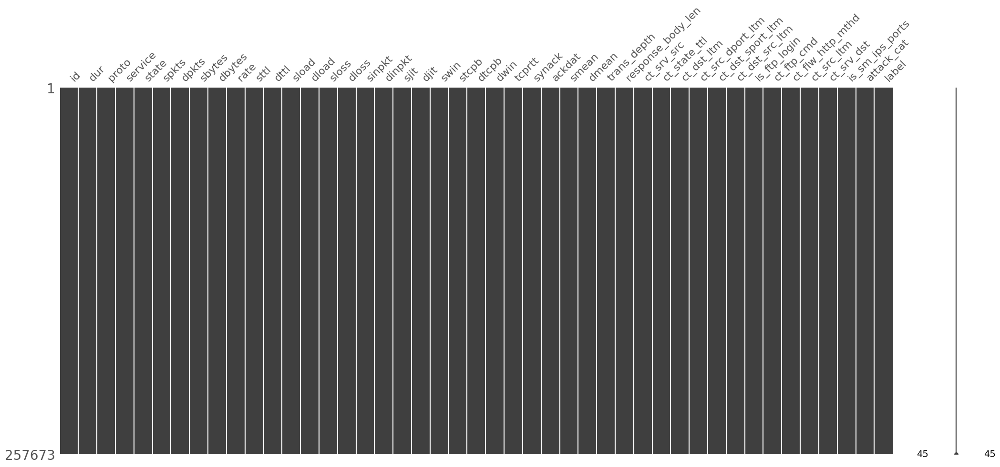

In [ ]:
import missingno
import pickle

missingno.matrix(useful_data)

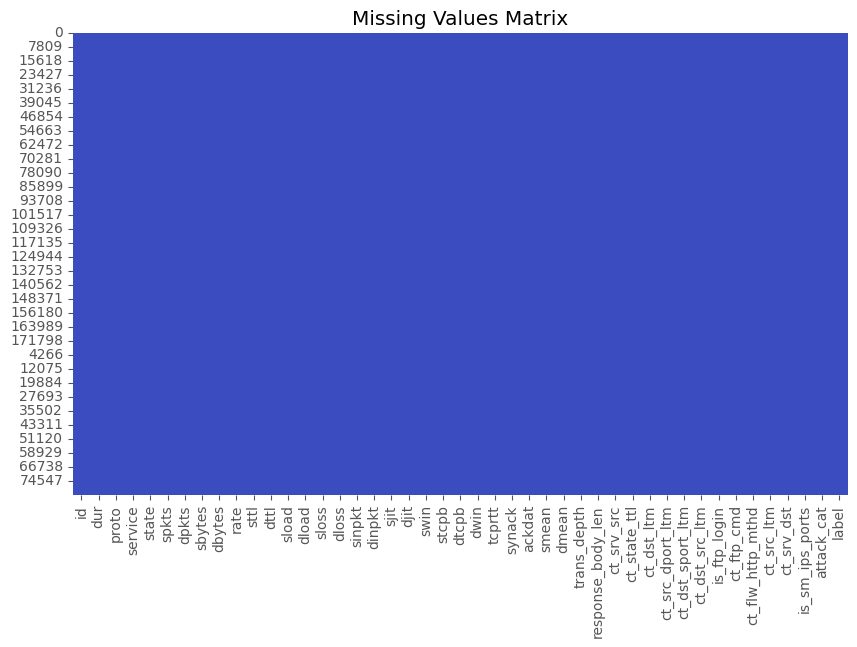

In [ ]:
plt.figure(figsize=(10,6))
sns.heatmap(useful_data.isnull(), cbar=False, cmap='coolwarm')
plt.title('Missing Values Matrix')
plt.show()

In [ ]:
useful_data.describe(include="all")

,id,dur,proto,service,state,spkts,dpkts,sbytes,dbytes,rate,...,ct_dst_sport_ltm,ct_dst_src_ltm,is_ftp_login,ct_ftp_cmd,ct_flw_http_mthd,ct_src_ltm,ct_srv_dst,is_sm_ips_ports,attack_cat,label
count,257673.000000,257673.000000,257673,257673,257673,257673.000000,257673.000000,2.576730e+05,2.576730e+05,2.576730e+05,...,257673.000000,257673.000000,257673.000000,257673.000000,257673.000000,257673.000000,257673.000000,257673.000000,257673,257673.000000
unique,NaN,NaN,133,13,11,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10,NaN
top,NaN,NaN,tcp,-,FIN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Normal,NaN
freq,NaN,NaN,123041,141321,117164,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,93000,NaN
mean,72811.823858,1.246715,NaN,NaN,NaN,19.777144,18.514703,8.572952e+03,1.438729e+04,9.125391e+04,...,4.032677,8.322964,0.012819,0.012850,0.132005,6.800045,9.121049,0.014274,NaN,0.639077
std,48929.917641,5.974305,NaN,NaN,NaN,135.947152,111.985965,1.737739e+05,1.461993e+05,1.603446e+05,...,5.831515,11.120754,0.116091,0.116421,0.681854,8.396266,10.874752,0.118618,NaN,0.480269
min,1.000000,0.000000,NaN,NaN,NaN,1.000000,0.000000,2.400000e+01,0.000000e+00,0.000000e+00,...,1.000000,1.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000,NaN,0.000000
25%,32210.000000,0.000008,NaN,NaN,NaN,2.000000,0.000000,1.140000e+02,0.000000e+00,3.078928e+01,...,1.000000,1.000000,0.000000,0.000000,0.000000,2.000000,2.000000,0.000000,NaN,0.000000
50%,64419.000000,0.004285,NaN,NaN,NaN,4.000000,2.000000,5.280000e+02,1.780000e+02,2.955665e+03,...,1.000000,3.000000,0.000000,0.000000,0.000000,3.000000,4.000000,0.000000,NaN,1.000000
75%,110923.000000,0.685777,NaN,NaN,NaN,12.000000,10.000000,1.362000e+03,1.064000e+03,1.250000e+05,...,3.000000,8.000000,0.000000,0.000000,0.000000,8.000000,11.000000,0.000000,NaN,1.000000


In [ ]:
useful_data['label'].value_counts().plot.bar()

NameError: ignored

<Axes: >

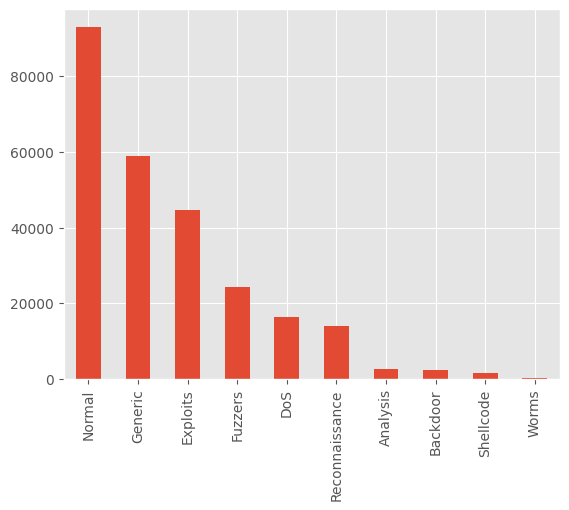

In [ ]:
useful_data['attack_cat'].value_counts().plot.bar()

In [ ]:
useful_data['label'].value_counts(normalize=True)

1    0.639077
0    0.360923
Name: label, dtype: float64

In [ ]:
labels = useful_data['label']
attacks = useful_data['attack_cat']

In [ ]:
# Select categorical columns
categorical_columns = useful_data.select_dtypes(include=['object']).columns
# Encode categorical features with LabelEncoder
encoding = LabelEncoder()
useful_data[categorical_columns] = useful_data[categorical_columns].apply(encoding.fit_transform)

In [ ]:
useful_data.head()

,id,dur,proto,service,state,spkts,dpkts,sbytes,dbytes,rate,...,ct_dst_sport_ltm,ct_dst_src_ltm,is_ftp_login,ct_ftp_cmd,ct_flw_http_mthd,ct_src_ltm,ct_srv_dst,is_sm_ips_ports,attack_cat,label
0,1,0.121478,113,0,4,6,4,258,172,74.087490,...,1,1,0,0,0,1,1,0,6,0
1,2,0.649902,113,0,4,14,38,734,42014,78.473372,...,1,2,0,0,0,1,6,0,6,0
2,3,1.623129,113,0,4,8,16,364,13186,14.170161,...,1,3,0,0,0,2,6,0,6,0
3,4,1.681642,113,3,4,12,12,628,770,13.677108,...,1,3,1,1,0,2,1,0,6,0
4,5,0.449454,113,0,4,10,6,534,268,33.373826,...,1,40,0,0,0,2,39,0,6,0


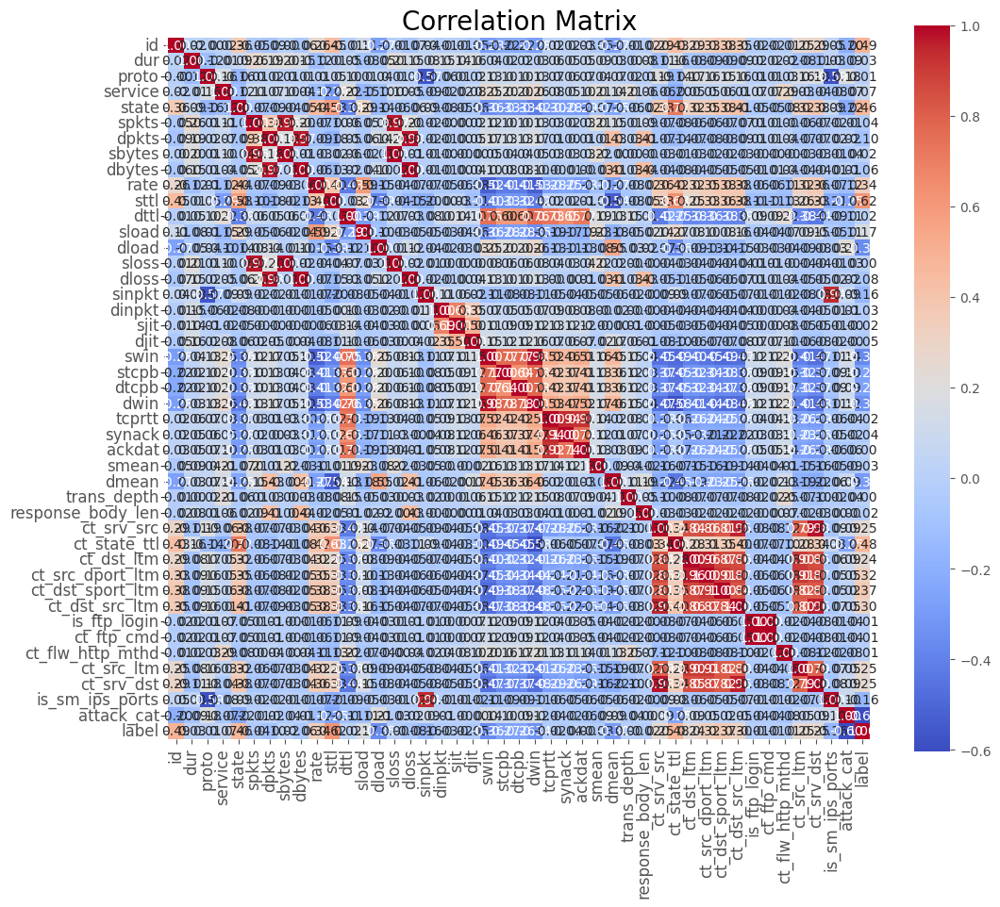

In [ ]:
plt.figure(figsize=(12, 10))
sns.heatmap(useful_data.corr(), cmap='coolwarm', annot=True, fmt='.2f', square=True)
plt.title('Correlation Matrix', fontsize=20)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.show()

In [ ]:
corr_matrix = useful_data.corr().abs()
correlated_vars = corr_matrix[corr_matrix > 0.98].stack().reset_index()
correlated_vars = correlated_vars[correlated_vars['level_0'] < correlated_vars['level_1']]
correlated_vars.columns = ['Var1', 'Var2', 'Corr']
correlated_vars = correlated_vars.sort_values(by='Corr', ascending=False)
print(correlated_vars)

          Var1          Var2      Corr
45  ct_ftp_cmd  is_ftp_login  0.998855
10      dbytes         dloss  0.996711
8       sbytes         sloss  0.995772
28        dwin          swin  0.980458


In [ ]:
corr_matrix = useful_data.corr().abs()
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))
to_drop = [column for column in upper.columns if any(upper[column] > 0.98)]
useful_data = useful_data.drop(columns=to_drop)

In [ ]:
useful_data = useful_data.drop(axis=1, columns=['id','attack_cat'])

In [ ]:
useful_data

,dur,proto,service,state,spkts,dpkts,sbytes,dbytes,rate,sttl,...,ct_dst_ltm,ct_src_dport_ltm,ct_dst_sport_ltm,ct_dst_src_ltm,is_ftp_login,ct_flw_http_mthd,ct_src_ltm,ct_srv_dst,is_sm_ips_ports,label
0,0.121478,113,0,4,6,4,258,172,74.087490,252,...,1,1,1,1,0,0,1,1,0,0
1,0.649902,113,0,4,14,38,734,42014,78.473372,62,...,1,1,1,2,0,0,1,6,0,0
2,1.623129,113,0,4,8,16,364,13186,14.170161,62,...,2,1,1,3,0,0,2,6,0,0
3,1.681642,113,3,4,12,12,628,770,13.677108,62,...,2,1,1,3,1,0,2,1,0,0
4,0.449454,113,0,4,10,6,534,268,33.373826,254,...,2,2,1,40,0,0,2,39,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
82327,0.000005,119,0,5,2,0,104,0,200000.005100,254,...,2,1,1,2,0,0,2,1,0,0
82328,1.106101,113,0,4,20,8,18062,354,24.410067,254,...,2,1,1,1,0,0,3,2,0,0
82329,0.000000,6,0,5,1,0,46,0,0.000000,0,...,1,1,1,1,0,0,1,1,1,0
82330,0.000000,6,0,5,1,0,46,0,0.000000,0,...,1,1,1,1,0,0,1,1,1,0


In [ ]:
X = useful_data.drop(columns=['label'])
feature_list = list(X.columns)

In [ ]:
print(len(feature_list))
feature_list

38


['dur',
 'proto',
 'service',
 'state',
 'spkts',
 'dpkts',
 'sbytes',
 'dbytes',
 'rate',
 'sttl',
 'dttl',
 'sload',
 'dload',
 'sinpkt',
 'dinpkt',
 'sjit',
 'djit',
 'swin',
 'stcpb',
 'dtcpb',
 'tcprtt',
 'synack',
 'ackdat',
 'smean',
 'dmean',
 'trans_depth',
 'response_body_len',
 'ct_srv_src',
 'ct_state_ttl',
 'ct_dst_ltm',
 'ct_src_dport_ltm',
 'ct_dst_sport_ltm',
 'ct_dst_src_ltm',
 'is_ftp_login',
 'ct_flw_http_mthd',
 'ct_src_ltm',
 'ct_srv_dst',
 'is_sm_ips_ports']

In [ ]:
y = useful_data['label']

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3)

In [ ]:
print("Training set:", len(X_train))
print("Testing set:", len(X_test))

Training set: 180371
Testing set: 77302


In [ ]:
standardrize_feature = StandardScaler().fit(X_train)
X_train = standardrize_feature.transform(X_train)
X_test = standardrize_feature.transform(X_test)

## Explainable AI (XAI) with a MLP (Multi-Layer Perceptron)

In [ ]:
!pip install lime

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 13.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283839 sha256=6d5f3570e3fb61bdf844620d4e492d0a1424d88bc58615e9577e60c1f77b674e
  Stored in directory: /root/.cache/pip/wheels/fd/a2/af/9ac0a1a85a27f314a06b39e1f492bee1547d52549a4606ed89
Successfully built lime


In [ ]:
import sklearn
import sklearn.datasets
import sklearn.ensemble
import numpy as np
import lime
import lime.lime_tabular
from __future__ import print_function
np.random.seed(1)

In [ ]:
MLP = MLPClassifier(random_state=123, solver='adam', max_iter=8000)
MLP.fit(X_train, y_train)

MLPClassifier(max_iter=8000, random_state=123)

In [ ]:
import numpy as np
import pandas as pd
from sklearn.datasets import load_breast_cancer
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import accuracy_score
from lime import lime_tabular

In [ ]:
# Create a LimeTabularExplainer object
explainer = lime_tabular.LimeTabularExplainer(X_train, feature_names=feature_list, class_names=['Normal', 'Attack'], kernel_width=3)

# Explain the prediction for the first instance in the test set
i = 0
exp = explainer.explain_instance(X_test[i], MLP.predict_proba, num_features=10)

# Show the explanation
exp.show_in_notebook(show_all=False)

# Print the true class
print('True class: ', y_test[i])

True class:  0    0
0    0
Name: label, dtype: int64


In [ ]:
# Create a LimeTabularExplainer object
explainer = lime_tabular.LimeTabularExplainer(X_train, feature_names=feature_list, class_names=['Normal', 'Attack'], kernel_width=3)

# Explain the prediction for the first instance in the test set
i = 0
exp = explainer.explain_instance(X_test[i], MLP.predict_proba, num_features=10)

# Show the explanation
exp.show_in_notebook(show_all=False)

# Print the true class
print('True class: ')

if (y_test[i].item() == 0):
    print('Normal')
else:
    print('Attack')

True class: 


ValueError: ignored

In [ ]:
# Create a LimeTabularExplainer object
explainer = lime_tabular.LimeTabularExplainer(X_train, feature_names=feature_list, class_names=['Normal', 'Attack'], kernel_width=3)

# Explain the prediction for the first instance in the test set
i = 0
exp = explainer.explain_instance(X_test[i], MLP.predict_proba, num_features=15)

# Show the explanation
exp.show_in_notebook(show_all=False)

# Print the true class
print('True class: ', y_test[i])

True class:  0    0
0    0
Name: label, dtype: int64


In [ ]:
# Create a LimeTabularExplainer object
explainer = lime_tabular.LimeTabularExplainer(X_train, feature_names=feature_list, class_names=['Normal', 'Attack'], kernel_width=3)

# Explain the prediction for the first instance in the test set
i = 2335
exp = explainer.explain_instance(X_test[i], MLP.predict_proba, num_features=15)

# Show the explanation
exp.show_in_notebook(show_all=False)

# Print the true class
print('True class: ', y_test[i])

True class:  0


In [ ]:
# Create a LimeTabularExplainer object
explainer = lime_tabular.LimeTabularExplainer(X_train, feature_names=feature_list, class_names=['Normal', 'Attack'], kernel_width=3)

# Explain the prediction for the first instance in the test set
i = 1033
exp = explainer.explain_instance(X_test[i], MLP.predict_proba, num_features=15)

# Show the explanation
exp.show_in_notebook(show_all=False)

# Print the true class
print('True class: ', y_test[i])

True class:  1


In [ ]:
# Create a LimeTabularExplainer object
explainer = lime_tabular.LimeTabularExplainer(X_train, feature_names=feature_list, class_names=['Normal', 'Attack'], kernel_width=3)

# Explain the prediction for the first instance in the test set
i = 1033
exp = explainer.explain_instance(X_test[i], MLP.predict_proba, num_features=10)

# Show the explanation
exp.show_in_notebook(show_all=False)

# Print the true class
print('True class: ', y_test[i])

True class:  1


In [ ]:
# Create a LimeTabularExplainer object
explainer = lime_tabular.LimeTabularExplainer(X_train, feature_names=feature_list, class_names=['Normal', 'Attack'], kernel_width=3)

# Explain the prediction for the first instance in the test set
i = 1033
exp = explainer.explain_instance(X_test[i], MLP.predict_proba, num_features=15)

# Show the explanation
exp.show_in_notebook(show_all=False)

# Print the true class
print('True class: ')

if (y_test[i] == 0):
    print('Normal')
else:
    print('Attack')

True class: 
Attack


In [ ]:
# Create a LimeTabularExplainer object
explainer = lime_tabular.LimeTabularExplainer(X_train, feature_names=feature_list, class_names=['Normal', 'Attack'], kernel_width=3)

# Explain the prediction for the first instance in the test set
i = 2335
exp = explainer.explain_instance(X_test[i], MLP.predict_proba, num_features=15)

# Show the explanation
exp.show_in_notebook(show_all=False)

# Print the true class
print('True class: ')

if (y_test[i] == 0):
    print('Normal')
else:
    print('Attack')

True class: 
Normal


In [ ]:
# Explain the prediction for the first instance in the test set
i = 2335
exp = explainer.explain_instance(X_test[i], MLP.predict_proba, num_features=12)

# Show the explanation
exp.show_in_notebook(show_all=False)

# Print the true class
print('True class: ')

if (y_test[i] == 0):
    print('Normal')
else:
    print('Attack')

True class: 
Normal


In [ ]:
pip install xgboost

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
from keras.models import Sequential
from keras.layers import SimpleRNN, Dense
from sklearn.model_selection import train_test_split
import numpy as np

In [ ]:

# Reshape input data to 3D format required for RNN
X_train = np.reshape(X_train, (X_train.shape[0], X_train.shape[1], 1))
X_test = np.reshape(X_test, (X_test.shape[0], X_test.shape[1], 1))

# Define RNN model
model = Sequential()
model.add(SimpleRNN(32, input_shape=(X_train.shape[1], 1)))
model.add(Dense(1, activation='sigmoid'))

# Compile the model
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])

# Train the model
model.fit(X_train, y_train, epochs=10, batch_size=64, validation_data=(X_test, y_test))

# Evaluate the model on test set
score = model.evaluate(X_test, y_test, verbose=0)
print('Test loss:', score[0])
print('Test accuracy:', score[1])


Epoch 1/10
2819/2819 [==============================] - 20s 7ms/step - loss: 0.2098 - accuracy: 0.9020 - val_loss: 0.1814 - val_accuracy: 0.9082
Epoch 2/10
2819/2819 [==============================] - 21s 7ms/step - loss: 0.1692 - accuracy: 0.9172 - val_loss: 0.1603 - val_accuracy: 0.9223
Epoch 3/10
2819/2819 [==============================] - 19s 7ms/step - loss: 0.1613 - accuracy: 0.9202 - val_loss: 0.1571 - val_accuracy: 0.9200
Epoch 4/10
2819/2819 [==============================] - 19s 7ms/step - loss: 0.1571 - accuracy: 0.9214 - val_loss: 0.1539 - val_accuracy: 0.9225
Epoch 5/10
2819/2819 [==============================] - 18s 6ms/step - loss: 0.1545 - accuracy: 0.9224 - val_loss: 0.1535 - val_accuracy: 0.9232
Epoch 6/10
2819/2819 [==============================] - 19s 7ms/step - loss: 0.1523 - accuracy: 0.9233 - val_loss: 0.1501 - val_accuracy: 0.9236
Epoch 7/10
2819/2819 [==============================] - 20s 7ms/step - loss: 0.1510 - accuracy: 0.9242 - val_loss: 0.1473 - val_ac

In [ ]:
# Make a prediction on a new input
new_input = np.array([[[0.5], [0.6], [0.7]]])  # 3 time steps, 1 feature
prediction = model.predict(new_input)

# Print the prediction
print(prediction)


ValueError: ignored

In [ ]:
!pip install investigatge

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
ERROR: Could not find a version that satisfies the requirement investigatge (from versions: none)
ERROR: No matching distribution found for investigatge


In [ ]:
!pip install innvestigate

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.7/66.7 kB 8.8 MB/s eta 0:00:00


In [ ]:
from innvestigate.analyzer.relevance_based.relevance_analyzer import LRP


In [ ]:
import numpy as np
import innvestigate
from innvestigate.analyzer.relevance_based.relevance_analyzer import LRP
from keras.models import Sequential
from keras.layers import Dense, LSTM, Dropout
from keras.optimizers import Adam
from keras.utils import to_categorical
from innvestigate.utils.keras.graph import preprocessing as iutils

ModuleNotFoundError: ignored

In [ ]:
import numpy as np
from keras.models import Sequential
from keras.layers import Dense, LSTM
from keras.utils import to_categorical
import innvestigate
import innvestigate.utils.keras as kutils

ModuleNotFoundError: ignored